In [1]:
# Standard libraries
import numpy as np
import pandas as pd
import joblib
import warnings

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from bokeh.io import curdoc, output_notebook
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, ColumnDataSource, CategoricalColorMapper, Slider
from bokeh.layouts import row, layout
from bokeh.transform import factor_cmap
from bokeh.palettes import Spectral6
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

# Machine learning preprocessing
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer, KNNImputer
from imblearn.over_sampling import SMOTE

# Machine learning models
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.svm import SVC, LinearSVC

# Machine learning metrics
from sklearn.metrics import (
    mean_squared_error, r2_score, accuracy_score, precision_score, 
    recall_score, confusion_matrix, classification_report, 
    ConfusionMatrixDisplay
)
from sklearn.datasets import make_classification, make_regression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import GridSearchCV, cross_val_score
from collections import Counter

# Settings to ignore warnings
warnings.filterwarnings('ignore')

In [2]:
default = pd.read_csv('Loan_default.csv')

In [3]:
default.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 255347 entries, 0 to 255346
Data columns (total 18 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   LoanID          255347 non-null  object 
 1   Age             255347 non-null  int64  
 2   Income          255347 non-null  int64  
 3   LoanAmount      255347 non-null  int64  
 4   CreditScore     255347 non-null  int64  
 5   MonthsEmployed  255347 non-null  int64  
 6   NumCreditLines  255347 non-null  int64  
 7   InterestRate    255347 non-null  float64
 8   LoanTerm        255347 non-null  int64  
 9   DTIRatio        255347 non-null  float64
 10  Education       255347 non-null  object 
 11  EmploymentType  255347 non-null  object 
 12  MaritalStatus   255347 non-null  object 
 13  HasMortgage     255347 non-null  object 
 14  HasDependents   255347 non-null  object 
 15  LoanPurpose     255347 non-null  object 
 16  HasCoSigner     255347 non-null  object 
 17  Default   

In [4]:
default.describe()

,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Default
count,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000
mean,43.498306,82499.304597,127578.865512,574.264346,59.541976,2.501036,13.492773,36.025894,0.500212,0.116128
std,14.990258,38963.013729,70840.706142,158.903867,34.643376,1.117018,6.636443,16.969330,0.230917,0.320379
min,18.000000,15000.000000,5000.000000,300.000000,0.000000,1.000000,2.000000,12.000000,0.100000,0.000000
25%,31.000000,48825.500000,66156.000000,437.000000,30.000000,2.000000,7.770000,24.000000,0.300000,0.000000
50%,43.000000,82466.000000,127556.000000,574.000000,60.000000,2.000000,13.460000,36.000000,0.500000,0.000000
75%,56.000000,116219.000000,188985.000000,712.000000,90.000000,3.000000,19.250000,48.000000,0.700000,0.000000
max,69.000000,149999.000000,249999.000000,849.000000,119.000000,4.000000,25.000000,60.000000,0.900000,1.000000


In [5]:
default.head()

,LoanID,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner,Default
0,I38PQUQS96,56,85994,50587,520,80,4,15.23,36,0.44,Bachelor's,Full-time,Divorced,Yes,Yes,Other,Yes,0
1,HPSK72WA7R,69,50432,124440,458,15,1,4.81,60,0.68,Master's,Full-time,Married,No,No,Other,Yes,0
2,C1OZ6DPJ8Y,46,84208,129188,451,26,3,21.17,24,0.31,Master's,Unemployed,Divorced,Yes,Yes,Auto,No,1
3,V2KKSFM3UN,32,31713,44799,743,0,3,7.07,24,0.23,High School,Full-time,Married,No,No,Business,No,0
4,EY08JDHTZP,60,20437,9139,633,8,4,6.51,48,0.73,Bachelor's,Unemployed,Divorced,No,Yes,Auto,No,0


In [11]:
# Calculate the counts for each unique value in the 'LoanPurpose' column
uniqueloanpurpose = default['LoanPurpose'].value_counts()

# Print the counts for each unique value
print("Counts of unique values in the 'LoanPurpose' column:")
print(uniqueloanpurpose)

Counts of unique values in the 'LoanPurpose' column:
Business     51298
Home         51286
Education    51005
Other        50914
Auto         50844
Name: LoanPurpose, dtype: int64


In [12]:
# Create a new DataFrame based on the condition that 'LoanPurpose' must be 'Home'
defaultloan = default[default['LoanPurpose'] == 'Home']

In [13]:
defaultloan.head()

,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner,Default
6,38,111188,177025,429,80,1,19.11,12,0.16,Bachelor's,Unemployed,Single,Yes,No,Home,Yes,0
7,56,126802,155511,531,67,4,8.15,60,0.43,PhD,Full-time,Married,No,No,Home,Yes,0
14,57,139699,88143,635,112,4,5.63,48,0.20,Master's,Part-time,Divorced,No,No,Home,No,0
16,20,119704,25697,313,49,1,9.63,24,0.28,PhD,Unemployed,Single,Yes,No,Home,No,0
26,29,114651,197648,343,58,3,21.07,24,0.19,Bachelor's,Part-time,Married,Yes,No,Home,Yes,0


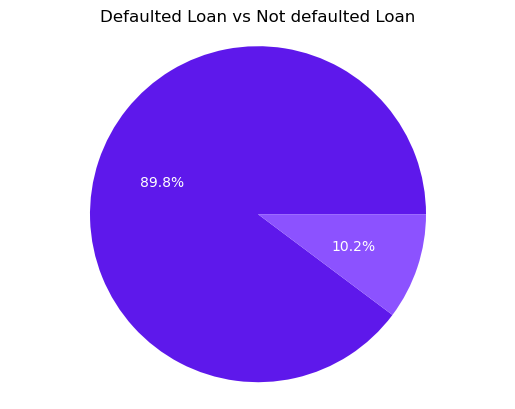

In [14]:
#Matplotlib is used here

labels = ['0', '1']
sizes = defaultloan.Default.value_counts(normalize=True)
colors = ['#5E18EB', '#8C52FF']

# plot
plt.pie(sizes, labels=labels, colors=colors,
        autopct=lambda p: '{:.1f}%'.format(p) if p > 0 else '',
        textprops={'color':"white"})
plt.axis('equal')
plt.title('Defaulted Loan vs Not defaulted Loan')
plt.show()

In [15]:
from bokeh.io import output_notebook, show
output_notebook()

Loading BokehJS ...

In [16]:
# Define categories and corresponding colors
categories = ['0', '1']
category_colors = ['#5E18EB', '#8C52FF']
color_mapping = {'0': category_colors[0], '1': category_colors[1]}

# Plot the histogram with LoanAmount on the x-axis and stacked Default
fig = px.histogram(defaultloan,
                   x="LoanAmount",
                   color="Default",
                   color_discrete_map=color_mapping,
                   barmode='stack',
                   title='Stacked Distribution of Default by Loan Amount',
                   labels={'LoanAmount': 'Loan Amount'},
                   text_auto=True)

# Update layout for centering the title and adjusting y-axis title
fig.update_layout(title_x=0.5, yaxis_title='Count')

# Show the plot
fig.show()

In [18]:
# Define categories and corresponding colors
categories = ['0', '1']
category_colors = ['#5E18EB', '#8C52FF']
color_mapping = {'0': category_colors[0], '1': category_colors[1]}

# Plot the histogram with LoanAmount on the x-axis and stacked Default
fig = px.histogram(defaultloan,
                   x="MaritalStatus",
                   color="Default",
                   color_discrete_map=color_mapping,
                   barmode='stack',
                   title='Stacked Distribution of Default by MaritalStatus',
                   labels={'MaritalStatus': 'MaritalStatus'},
                   text_auto=True)

# Update layout for centering the title and adjusting y-axis title
fig.update_layout(title_x=0.5, yaxis_title='Count')

# Show the plot
fig.show()

In [19]:
# Define categories and corresponding colors
categories = ['0', '1']
category_colors = ['#5E18EB', '#8C52FF']
color_mapping = {'0': category_colors[0], '1': category_colors[1]}

# Plot the histogram with LoanAmount on the x-axis and stacked Default
fig = px.histogram(defaultloan,
                   x="HasDependents",
                   color="Default",
                   color_discrete_map=color_mapping,
                   barmode='stack',
                   title='Stacked Distribution of Default by Has Dependents',
                   labels={'HasDependents': 'Has Dependents'},
                   text_auto=True)

# Update layout for centering the title and adjusting y-axis title
fig.update_layout(title_x=0.5, yaxis_title='Count')

# Show the plot
fig.show()

In [20]:
# Define categories and corresponding colors
categories = ['0', '1']
category_colors = ['#5E18EB', '#8C52FF']
color_mapping = {'0': category_colors[0], '1': category_colors[1]}

# Plot the histogram with LoanAmount on the x-axis and stacked Default
fig = px.histogram(defaultloan,
                   x="Education",
                   color="Default",
                   color_discrete_map=color_mapping,
                   barmode='stack',
                   title='Stacked Distribution of Default by Education',
                   labels={'Education': 'Education'},
                   text_auto=True)

# Update layout for centering the title and adjusting y-axis title
fig.update_layout(title_x=0.5, yaxis_title='Count')

# Show the plot
fig.show()

In [21]:
# Define categories and corresponding colors
category_colors = ['#5E18EB', '#8C52FF']
color_mapping = {'1': category_colors[0], '0': category_colors[1]}

# Determine the range for bins based on the max ApplicantIncome
max_income = defaultloan['NumCreditLines'].max()
bin_size = 2000  
nbins = int(max_income / bin_size)  

# Plot the histogram with ApplicantIncome on the x-axis and stacked Default
fig = px.histogram(defaultloan,
                   x="NumCreditLines",
                   color="Default",
                   color_discrete_map=color_mapping,
                   barmode='stack',
                   title='Stacked Distribution of Default based on NumCreditLines',
                   labels={'NumCreditLines': 'NumCreditLines'},
                   text_auto=True,
                   nbins=nbins)  

# Update layout for centering the title and adjusting y-axis title
fig.update_layout(
    title_x=0.5,
    yaxis_title='Count',
    xaxis=dict(
        # Update the xaxis properties for tick intervals at every $2,500
        tickvals=[i * bin_size for i in range(nbins+1)],  # This will set tick marks every 2.5k
        ticktext=[f"{i * bin_size / 1000}k" for i in range(nbins+1)]  # Labels the ticks as '2.5k', '5k', etc.
    )
)

# Show the plot
fig.show()

In [22]:
# Define categories and corresponding colors
category_colors = ['#5E18EB', '#8C52FF']
color_mapping = {'1': category_colors[0], '0': category_colors[1]}

# Determine the range for bins based on the max ApplicantIncome
max_income = defaultloan['Income'].max()
bin_size = 2000  
nbins = int(max_income / bin_size)  

# Plot the histogram with ApplicantIncome on the x-axis and stacked Default
fig = px.histogram(defaultloan,
                   x="Income",
                   color="Default",
                   color_discrete_map=color_mapping,
                   barmode='stack',
                   title='Stacked Distribution of Default based on ApplicantIncome',
                   labels={'Income': 'Income'},
                   text_auto=True,
                   nbins=nbins)  

# Update layout for centering the title and adjusting y-axis title
fig.update_layout(
    title_x=0.5,
    yaxis_title='Count',
    xaxis=dict(
        # Update the xaxis properties for tick intervals at every $2,500
        tickvals=[i * bin_size for i in range(nbins+1)],  # This will set tick marks every 2.5k
        ticktext=[f"{i * bin_size / 1000}k" for i in range(nbins+1)]  # Labels the ticks as '2.5k', '5k', etc.
    )
)

# Show the plot
fig.show()

In [23]:
# Define categories and corresponding colors
category_colors = ['#5E18EB', '#8C52FF']
color_mapping = {'1': category_colors[0], '0': category_colors[1]}

# Determine the range for bins based on the max ApplicantIncome
max_income = defaultloan['InterestRate'].max()
bin_size = 2000  
nbins = int(max_income / bin_size)  

# Plot the histogram with ApplicantIncome on the x-axis and stacked Default
fig = px.histogram(defaultloan,
                   x="InterestRate",
                   color="Default",
                   color_discrete_map=color_mapping,
                   barmode='stack',
                   title='Stacked Distribution of Default based on InterestRate',
                   labels={'InterestRate': 'InterestRate'},
                   text_auto=True,
                   nbins=nbins)  

# Update layout for centering the title and adjusting y-axis title
fig.update_layout(
    title_x=0.5,
    yaxis_title='Count',
    xaxis=dict(
        # Update the xaxis properties for tick intervals at every $2,500
        tickvals=[i * bin_size for i in range(nbins+1)],  # This will set tick marks every 2.5k
        ticktext=[f"{i * bin_size / 1000}k" for i in range(nbins+1)]  # Labels the ticks as '2.5k', '5k', etc.
    )
)

# Show the plot
fig.show()

In [24]:
# Define categories and corresponding colors
category_colors = ['#5E18EB', '#8C52FF']
color_mapping = {'1': category_colors[0], '0': category_colors[1]}

# Determine the range for bins based on the max ApplicantIncome
max_income = defaultloan['DTIRatio'].max()
bin_size = 2000  
nbins = int(max_income / bin_size)  

# Plot the histogram with ApplicantIncome on the x-axis and stacked Default
fig = px.histogram(defaultloan,
                   x="DTIRatio",
                   color="Default",
                   color_discrete_map=color_mapping,
                   barmode='stack',
                   title='Stacked Distribution of Default based on DTIRatio',
                   labels={'DTIRatio': 'DTIRatio'},
                   text_auto=True,
                   nbins=nbins)  

# Update layout for centering the title and adjusting y-axis title
fig.update_layout(
    title_x=0.5,
    yaxis_title='Count',
    xaxis=dict(
        # Update the xaxis properties for tick intervals at every $2,500
        tickvals=[i * bin_size for i in range(nbins+1)],  # This will set tick marks every 2.5k
        ticktext=[f"{i * bin_size / 1000}k" for i in range(nbins+1)]  # Labels the ticks as '2.5k', '5k', etc.
    )
)

# Show the plot
fig.show()

In [25]:
# Define categories and corresponding colors
category_colors = ['#5E18EB', '#8C52FF']
color_mapping = {'1': category_colors[0], '0': category_colors[1]}

# Determine the range for bins based on the max ApplicantIncome
max_income = defaultloan['MonthsEmployed'].max()
bin_size = 2000  
nbins = int(max_income / bin_size)  

# Plot the histogram with ApplicantIncome on the x-axis and stacked Default
fig = px.histogram(defaultloan,
                   x="MonthsEmployed",
                   color="Default",
                   color_discrete_map=color_mapping,
                   barmode='stack',
                   title='Stacked Distribution of Default based on MonthsEmployed',
                   labels={'MonthsEmployed': 'Months Employed'},
                   text_auto=True,
                   nbins=nbins)  

# Update layout for centering the title and adjusting y-axis title
fig.update_layout(
    title_x=0.5,
    yaxis_title='Count',
    xaxis=dict(
        # Update the xaxis properties for tick intervals at every $2,500
        tickvals=[i * bin_size for i in range(nbins+1)],  # This will set tick marks every 2.5k
        ticktext=[f"{i * bin_size / 1000}k" for i in range(nbins+1)]  # Labels the ticks as '2.5k', '5k', etc.
    )
)

# Show the plot
fig.show()

In [64]:
numerical=defaultloan.select_dtypes([np.number]).columns
print(numerical)
categorycol=defaultloan.select_dtypes('object').columns
print(categorycol)

Index(['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed',
       'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio', 'Default'],
      dtype='object')
Index(['Education', 'EmploymentType', 'MaritalStatus', 'HasMortgage',
       'HasDependents', 'LoanPurpose', 'HasCoSigner'],
      dtype='object')


In [68]:
le = LabelEncoder()
categoricalfeatures = ['Education', 'EmploymentType', 'MaritalStatus', 'HasMortgage',
       'HasDependents', 'LoanPurpose', 'HasCoSigner']
for col in defaultloan[categoricalfeatures]:
    defaultloan[col]=le.fit_transform(defaultloan[col])

In [69]:
#Create a StandardScaler object
scaler = StandardScaler()
# Select the columns to be normalized
normalizedcols = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed',
       'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio']
# Fit the scaler to the selected columns and transform the data
defaultloan[normalizedcols] = scaler.fit_transform(defaultloan[normalizedcols])

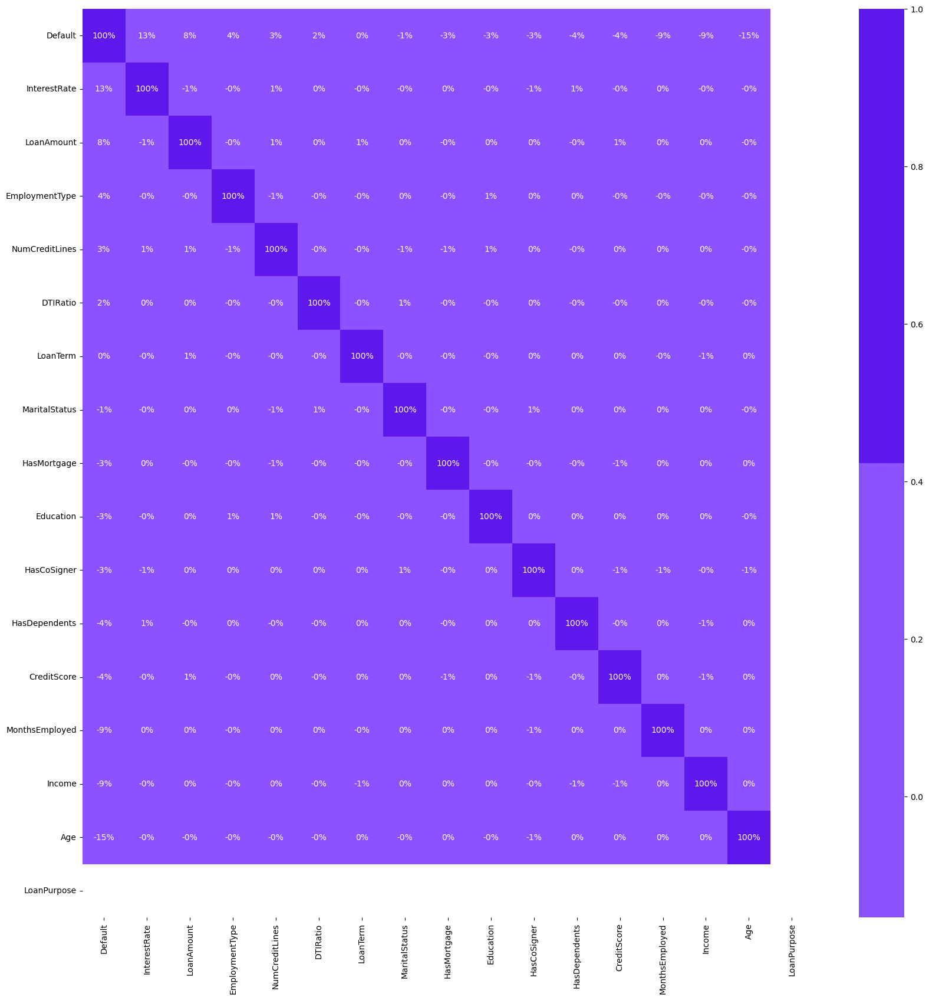

In [71]:
custom_cmap = ListedColormap(['#8C52FF','#5E18EB'])

# Create a correlation matrix with method='spearman'
corr_matrix = defaultloan.corr(method='spearman')

# Sort the features by their correlation values with the target variable
target_variable = 'Default'
sorted_features = corr_matrix[target_variable].sort_values(ascending=False)

# Plot a heatmap of the sorted correlation matrix
plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix.loc[sorted_features.index, sorted_features.index], annot=True, fmt='.0%', cmap=custom_cmap)
plt.show()

           Feature  Importance
1           Income    0.137920
6     InterestRate    0.128785
2       LoanAmount    0.124751
3      CreditScore    0.107309
4   MonthsEmployed    0.100885
0              Age    0.100882
8         DTIRatio    0.091412
7         LoanTerm    0.039614
5   NumCreditLines    0.033535
10  EmploymentType    0.032014
9        Education    0.031229
11   MaritalStatus    0.026698
12     HasMortgage    0.015643
15     HasCoSigner    0.015141
13   HasDependents    0.014183
14     LoanPurpose    0.000000
Selected Features: ['Income', 'InterestRate', 'LoanAmount']


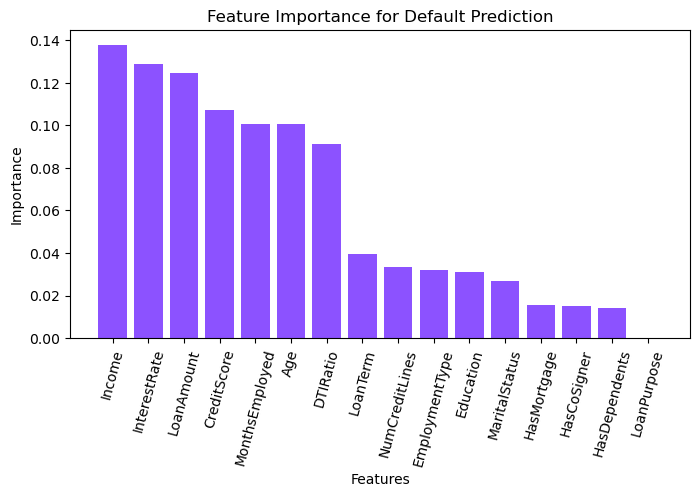

In [82]:
# Separate the features (X) and target variable (y)
X = defaultloan.drop('Default', axis=1)
y = defaultloan['Default']

# Create a Random Forest classifier
rf = RandomForestClassifier()

# Fit the Random Forest model
rf.fit(X, y)

# Get feature importances from the trained Random Forest model
feature_importances = rf.feature_importances_

# Create a DataFrame to store feature importance scores
feature_importances_defaultloan = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance scores in descending order
feature_importances_defaultloan = feature_importances_defaultloan.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(feature_importances_defaultloan)

# Select the top k features based on importance scores
k = 3  # Specify the number of top features you want to select
selected_features = feature_importances_defaultloan['Feature'][:k].tolist()
print("Selected Features:", selected_features)

plt.figure(figsize=(8, 4))  # Set the figure size as needed
plt.bar(feature_importances_defaultloan['Feature'], feature_importances_defaultloan['Importance'], color='#8C52FF')
plt.ylabel('Importance')  
plt.xlabel('Features')   
plt.title('Feature Importance for Default Prediction')
plt.xticks(rotation=75) 
plt.show()

# Subset the data with selected features
X_selected = X[selected_features]

# Apply SMOTE to balance the dataset
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X_selected, y)

In [20]:
#pip install shap

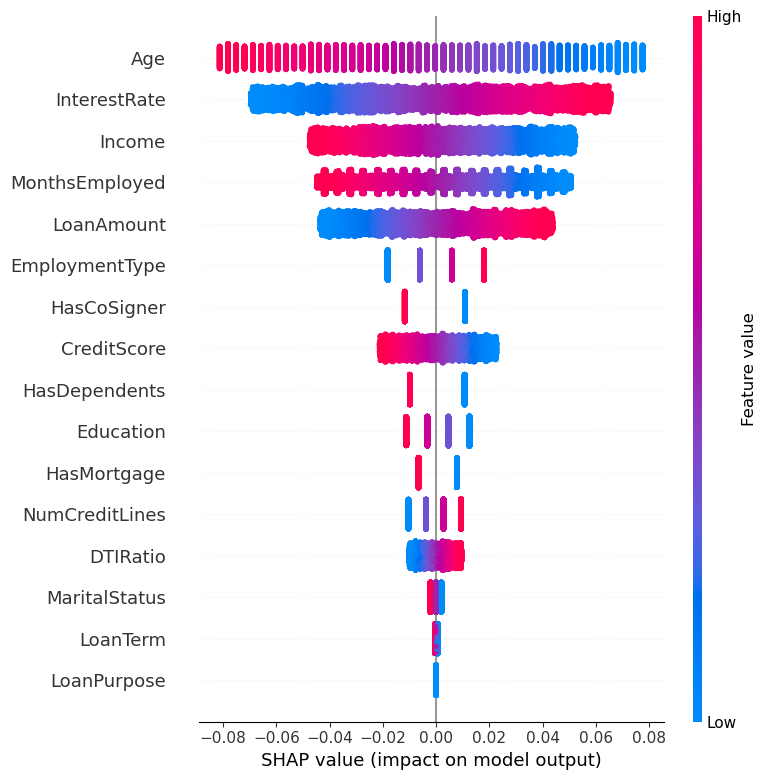

In [89]:
import shap

# Split the data into features and target
X = defaultloan.drop(columns=['Default'])  # Replace 'target_column' with the actual target column name
y = defaultloan['Default']  # Replace 'target_column' with the actual target column name

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Create the SHAP explainer object
explainer = shap.Explainer(model, X_train)

# Compute SHAP values
shap_values = explainer(X_test)

# Visualize the SHAP values
shap.summary_plot(shap_values, X_test)

In [92]:
shap.initjs() 

In [93]:
explainer = shap.Explainer(pipe.best_estimator_.named_steps['randomforestclassifier'], algorithm='tree') 
shap_values = explainer(Xexp) 

NameError: name 'pipe' is not defined

In [ ]:
import dalex as dx

X = default.drop(columns='Default)
y = default.Default